In [50]:
#import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats


In [51]:
s = "/Users/Fabio/Desktop/CMS-SpikingNeuralNetwork/Code/MODE/CSV/NL0=6_NL1=6_NCl=6_CF01=1.00_CFI0=1.00_CFI1=1.00_alfa=2.00_output.csv"

In [52]:
data_pd = pd.read_csv(s) #NEW WORKs
data_pd.describe()


,Event,ID,Stream,Time,Pclass
count,5144.000000,5144.000000,5144.000000,5.144000e+03,5144.00000
mean,99759.361003,1.165047,11.179821,6.467096e-07,2.37675
std,143.305066,0.371259,5.651432,3.542471e-07,1.68533
min,99501.000000,1.000000,0.000000,1.415170e-08,0.00000
25%,99637.000000,1.000000,6.000000,3.626407e-07,1.00000
50%,99761.000000,1.000000,12.000000,6.649720e-07,2.00000
75%,99885.000000,1.000000,16.000000,9.435535e-07,4.00000
max,99997.000000,2.000000,20.000000,1.242740e-06,5.00000


In [53]:
data = dict()
for col in data_pd.columns:
    data[col] = data_pd[col].values

In [54]:
print(data.keys())

dict_keys(['Event', 'ID', 'Stream', 'Time', 'Pclass'])


In [55]:
type(data['Event'])

numpy.ndarray

Preprocess

In [56]:
#moltiply data['Stream'] by -1 if it a track (data['id'] == 1)
data['Stream'] = np.where(data['ID'] == 1, -1*data['Stream'], data['Stream'])

Plots

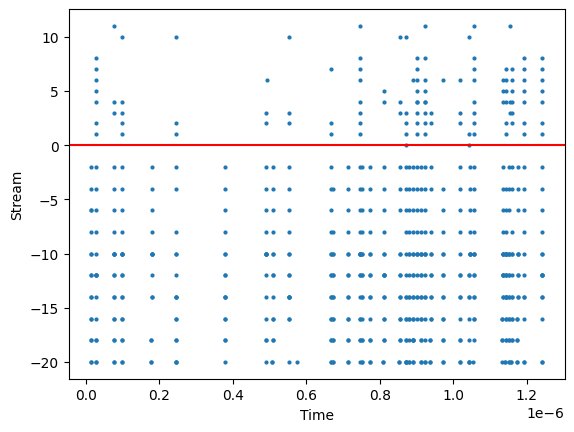

In [57]:
class_mask = data_pd['Pclass'] == 2
plt.scatter(data['Time'][class_mask], data['Stream'][class_mask] , s=4)
plt.xlabel('Time')
plt.ylabel('Stream')
plt.axhline(0, c = 'r')

## Looking at one single event

In [58]:
N_EV = np.unique(data['Event'][data['Pclass'] == 5])[-2]
N_EV

99966

In [59]:
#select an event using data_dict['Event']
mask_ev1 = data_pd['Event'] == N_EV

ev1 = {}
for k in data_pd.keys():
    ev1[k] = data[k][mask_ev1]


In [60]:
t_track = ev1['Time'][ev1['ID'] == 1]
t_track

array([4.19510e-07, 4.19510e-07, 4.19510e-07, 4.19510e-07, 4.19510e-07,
       4.19510e-07, 4.19510e-07, 4.19510e-07, 4.19743e-07, 4.19743e-07,
       4.19743e-07, 4.19743e-07, 4.19743e-07, 4.19743e-07])

In [61]:
t_neur = ev1['Time'][ev1['ID'] == 2]
t_neur

array([4.19743e-07, 4.19743e-07, 4.19743e-07, 4.19743e-07, 4.19743e-07,
       4.19743e-07, 4.19743e-07])

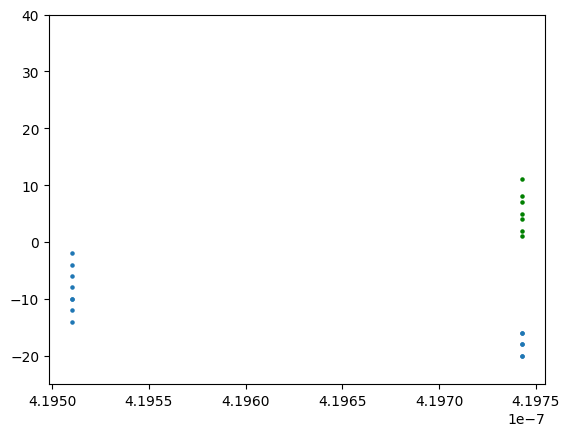

In [62]:
plt.scatter(t_track, ev1['Stream'][ev1['ID'] == 1], s=5)
plt.scatter(t_neur, ev1['Stream'][ev1['ID'] == 2], c='g', s = 5)
plt.ylim(-25,40)
plt.show()
#plot the grid on x and y


In [63]:
hit_neur = ev1['Stream'][ev1['ID'] == 2]
hit_neur

array([ 1,  2,  8,  4,  5, 11,  7])

In [64]:
tau = 1e-9

Every spike that arrives induces a change in the membrane potential according to a certain function.\
These changes are smoothed to zero after a time of 7 τ from the arrival of the impulse.\
So, when the neuron receives the last hit of the trace, after a time of 7 τ, the effect of that impulse on the membrane potential is automatically zero.

In [65]:
min_t_track = np.min(t_track)- 7*tau
max_t_track = np.max(t_track)+ 7*tau

mask_sel_neur = np.logical_and(t_neur>min_t_track, t_neur<max_t_track)
mask_sel_neur

array([ True,  True,  True,  True,  True,  True,  True])

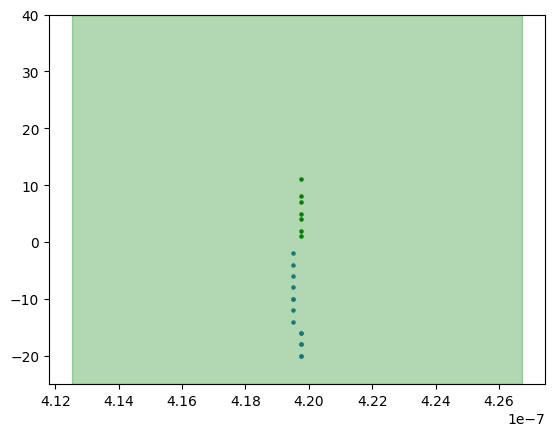

In [66]:
# now the same plt but with filled zoned in red where i excluded the points
plt.scatter(t_track, ev1['Stream'][ev1['ID'] == 1], s=5)
plt.scatter(t_neur[mask_sel_neur], hit_neur[mask_sel_neur], c='g', s = 5)
plt.ylim(-25,40)
plt.axvspan(min_t_track, max_t_track, alpha=0.3, color='green')

plt.show()

In [67]:
streams = []
for ev in np.unique(data['Event']):
    streams.append(data['Stream'][data['Event'] == ev])

s = []
for i in range(len(streams)):
    s.append(streams[i][streams[i] > 0])
print(s[4])

[10]


# Define Distance

In [68]:
# Genera un dataset fittizio di distanze con lunghezza variabile senza zeri
np.random.seed(42)  # Per riproducibilità
num_samples = 50
max_distance_length = 20

# Genera distanze casuali con lunghezza variabile per ciascun passo temporale
distances = [np.random.choice(np.arange(12), size=np.random.randint(1, 13), replace=False) for _ in range(num_samples)]
distances

[array([11,  9,  0,  8,  5,  2,  1]),
 array([ 8, 10,  0,  6, 11,  9,  3,  1]),
 array([11, 10,  6,  4,  3,  1,  7,  2,  0,  8,  5,  9]),
 array([9, 1, 5]),
 array([0, 5, 2, 6]),
 array([ 8,  9,  5,  4,  6, 10,  1]),
 array([ 4,  2,  7,  0,  6, 11, 10,  8,  9,  1]),
 array([11,  2,  5,  0, 10]),
 array([1]),
 array([2]),
 array([ 1, 10,  9,  0, 11,  8,  5]),
 array([10,  1,  3]),
 array([ 1,  8,  5, 10,  9,  7,  4,  3,  0,  6]),
 array([ 7,  9,  0,  8,  4, 10,  1, 11,  5,  2,  6]),
 array([1, 2, 7, 4, 8, 5]),
 array([11,  1, 10,  7,  4,  0,  9,  5,  6]),
 array([ 2,  4,  6,  1,  9,  8,  3,  0, 11,  5, 10,  7]),
 array([9, 5]),
 array([ 8,  7, 11,  3, 10,  1]),
 array([ 9,  8,  1, 10,  4,  5]),
 array([11,  1,  9,  6,  3,  2]),
 array([ 5,  1, 11]),
 array([11,  4,  3,  2,  7,  5,  6,  1]),
 array([11,  6,  2,  7,  4, 10,  5,  9,  1,  0]),
 array([ 4,  1,  6, 11,  7,  0,  5,  3,  9]),
 array([4, 1, 9, 6]),
 array([ 9, 10]),
 array([5, 9, 1, 4]),
 array([8, 3, 4, 0, 1, 6]),
 array([ 7,  

In [69]:
from itertools import combinations

#use prange 
from numba import prange

def f_distance(seq1, seq2):
    n1, n2 = len(seq1), len(seq2)
    
    # Genera tutte le possibili coppie di indici
    all_pairs_seq1 = list(combinations(range(n1), 2))
    all_pairs_seq2 = list(combinations(range(n2), 2))
    
    # Inizializza il conteggio per coppie concordanti e discordanti
    concordant_count = 0
    discordant_count = 0

    # Conta le coppie concordanti e discordanti
    for i, j in all_pairs_seq1:
        for k, l in all_pairs_seq2:
            if (seq1[i] < seq1[j] and seq2[k] < seq2[l]) or (seq1[i] > seq1[j] and seq2[k] > seq2[l]):
                #check if the the firt couple is the same as the second couple
                print(f"Concordant: ({seq1[i]}, {seq1[j]}) and ({seq2[k]}, {seq2[l]})")
                if (seq1[i] == seq2[k]) and (seq1[j] == seq2[l]):
                    concordant_count += 1
                    print("Plus counted")
            elif (seq1[i] < seq1[j] and seq2[k] > seq2[l]) or (seq1[i] > seq1[j] and seq2[k] < seq2[l]):
                print(f"Discordant: ({seq1[i]}, {seq1[j]}) and ({seq2[k]}, {seq2[l]})")
                if (seq1[i] == seq2[l]) and (seq1[j] == seq2[k]):
                    discordant_count += 1
                    print("Negative counted")


    if concordant_count == 0 and discordant_count == 0:
        return 0
    
    tau = (concordant_count - discordant_count) / (concordant_count + discordant_count)
    
    return tau

# Esempio di utilizzo
array1 = [1, 2, 3]
array2 = [3, 2, 1]

result_tau = f_distance(array1, array2)
print(f"Distance: {result_tau}")


Discordant: (1, 2) and (3, 2)
Discordant: (1, 2) and (3, 1)
Discordant: (1, 2) and (2, 1)
Negative counted
Discordant: (1, 3) and (3, 2)
Discordant: (1, 3) and (3, 1)
Negative counted
Discordant: (1, 3) and (2, 1)
Discordant: (2, 3) and (3, 2)
Negative counted
Discordant: (2, 3) and (3, 1)
Discordant: (2, 3) and (2, 1)
Distance: -1.0


In [70]:
max_sequence_length = 20

In [71]:
# Genera un set di dati con 50 elementi di lunghezza variabile
np.random.seed(42)
num_samples = 100
max_sequence_length = 10

#generate 5 differet categories of sequence and then mix them and then label them
ord_neur = [list(np.random.choice(np.arange(1, 12), size=np.random.randint(1, max_sequence_length + 1), replace=False)) for _ in range(num_samples)]
ord_neur


[[11, 10, 1, 9, 6, 3, 2],
 [11, 10, 1, 9, 7, 4, 2, 5],
 [10, 11, 7, 5, 4, 2, 8, 3, 1, 9],
 [10, 2, 6],
 [1, 6, 3, 7],
 [9, 10, 6, 5, 7, 11, 2],
 [3, 1, 7, 5, 10, 8, 11, 9, 2, 6],
 [3, 1, 6, 4, 11, 2, 10, 5],
 [6, 2, 10, 5, 3, 4, 8, 11, 7],
 [6, 9, 11],
 [8, 10, 11, 4, 3, 5, 6, 9],
 [8, 4, 2],
 [10, 5, 2, 6, 4, 1, 8],
 [9, 1, 5, 2, 10, 6, 8],
 [11, 9, 1, 7, 2, 3, 8, 10, 4],
 [6],
 [6, 8, 11, 7, 10, 9, 4, 2, 3],
 [8],
 [8],
 [8, 2, 5, 1, 11],
 [10, 9, 7, 11, 1, 3, 8, 6],
 [1, 8, 6],
 [6, 10, 5, 9, 4, 3, 11, 2, 7],
 [11, 9, 6, 5, 8, 1, 2],
 [9],
 [5, 11, 2, 7, 9, 3, 4, 10],
 [10, 8, 4, 7],
 [2, 8, 3, 7, 9, 5, 6, 10, 11],
 [11],
 [9, 2],
 [2],
 [6, 2, 11, 9, 10],
 [1, 5],
 [5, 4, 8, 3, 6, 7, 1],
 [6, 11, 9, 8, 4, 5, 1],
 [2, 10, 5, 3],
 [10, 8],
 [8, 2, 5, 11, 10, 3],
 [8, 2, 1, 10, 3],
 [6, 10, 5, 9, 2, 4, 11, 7, 8, 1],
 [8, 3, 6, 10, 2, 1, 11, 4, 9, 7],
 [2, 11],
 [4, 9, 11, 2, 8, 1],
 [6],
 [1, 8, 11, 3, 6, 9],
 [10],
 [11, 4, 7, 8, 6, 10, 5, 9],
 [4],
 [8, 6, 5, 7, 9, 4, 1, 3],
 [3, 8,

Discordant: (10, 2) and (3, 4)
Discordant: (10, 2) and (3, 11)
Discordant: (10, 2) and (3, 10)
Concordant: (10, 2) and (3, 1)
Concordant: (10, 2) and (3, 2)
Discordant: (10, 2) and (3, 4)
Discordant: (10, 2) and (4, 11)
Discordant: (10, 2) and (4, 10)
Concordant: (10, 2) and (4, 1)
Concordant: (10, 2) and (4, 2)
Concordant: (10, 2) and (4, 3)
Concordant: (10, 2) and (11, 10)
Concordant: (10, 2) and (11, 1)
Concordant: (10, 2) and (11, 2)
Concordant: (10, 2) and (11, 3)
Concordant: (10, 2) and (11, 4)
Concordant: (10, 2) and (10, 1)
Concordant: (10, 2) and (10, 2)
Plus counted
Concordant: (10, 2) and (10, 3)
Concordant: (10, 2) and (10, 4)
Discordant: (10, 2) and (1, 2)
Discordant: (10, 2) and (1, 3)
Discordant: (10, 2) and (1, 4)
Discordant: (10, 2) and (2, 3)
Discordant: (10, 2) and (2, 4)
Discordant: (10, 2) and (3, 4)
Discordant: (10, 3) and (3, 4)
Discordant: (10, 3) and (3, 11)
Discordant: (10, 3) and (3, 10)
Negative counted
Concordant: (10, 3) and (3, 1)
Concordant: (10, 3) and 

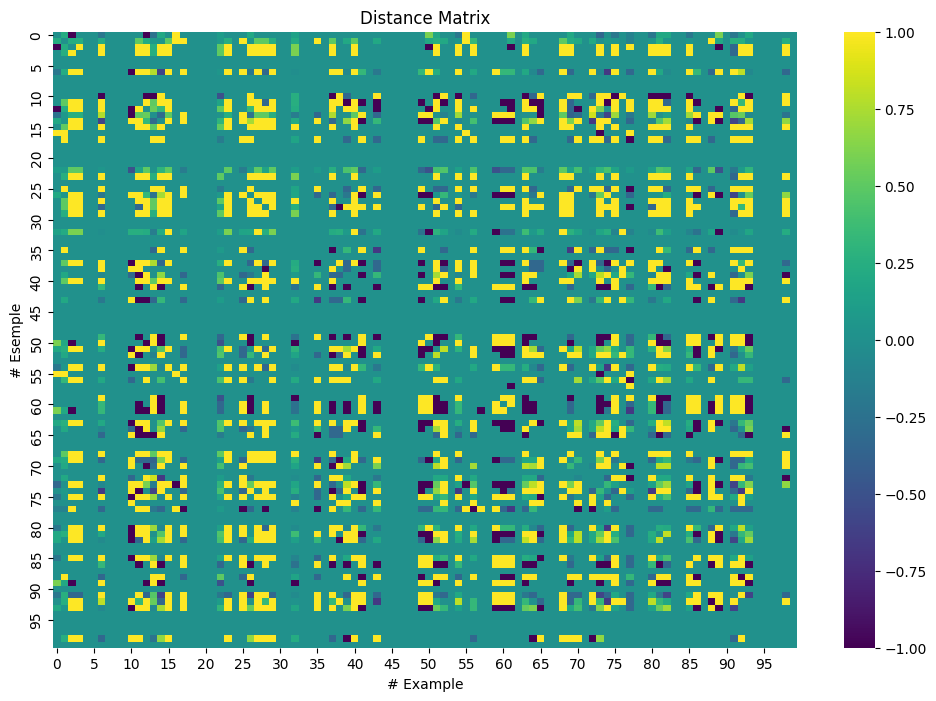

In [72]:
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations

# Calcola la matrice delle distanze di Kendall
f_distances = np.zeros((num_samples, num_samples))
for i, j in combinations(range(num_samples), 2):
    distance = f_distance(s[i], s[j])
    f_distances[i, j] = distance
    f_distances[j, i] = distance  # Poiché la matrice delle distanze è simmetrica

# Visualizza la matrice delle distanze
plt.figure(figsize=(12, 8))
sns.heatmap(f_distances, cmap='viridis',  fmt=".0f", xticklabels=5, yticklabels=5)
plt.title('Distance Matrix')
plt.xlabel('# Example')
plt.ylabel('# Esemple')
plt.show()


In [73]:
#check for NaN on inf in f_distances
# np.isnan(f_distances).any()
# np.isinf(f_distances).any()
f_distances


array([[ 0.        ,  0.23076923, -1.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.23076923,  0.        ,  0.23076923, ...,  0.        ,
         0.25      ,  0.        ],
       [-1.        ,  0.23076923,  0.        , ...,  0.        ,
         1.        ,  0.        ],
       ...,
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.25      ,  1.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ]])

In [74]:
# using spectral clustering on f_distances
from sklearn.cluster import SpectralClustering

X = f_distances
spec_clustering = SpectralClustering(n_clusters=5,
        random_state=0).fit(X)
spec_clustering.labels_
spec_clustering


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_spectral.py:688: UserWarning: The spectral clustering API has changed. ``fit``now constructs an affinity matrix from data. To use a custom affinity matrix, set ``affinity=precomputed``.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:392: UserWarning: Exited postprocessing with accuracies 
[4.78805418e-15 2.15508099e-07 8.19167737e-08 4.98572587e-07
 1.70356263e-06 1.86512464e-06]
not reaching the requested tolerance 1.4901161193847656e-06.
  _, diffusion_map = lobpcg(


SpectralClustering(n_clusters=5, random_state=0)

In [75]:
from sklearn.cluster import KMeans
import seaborn as sns


# Calcola le distanze tra le sequenze
distances = np.array(f_distances)

# Esegui il clustering con K-Means
n_clusters = 5  
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
clusters = kmeans.fit_predict(distances)


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [76]:
distances.shape

(100, 100)

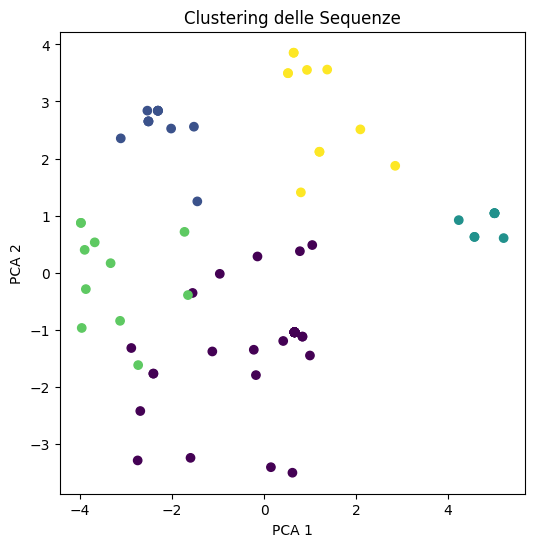

In [77]:
#plot the clusters on a 2d plas using pca
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca.fit(distances)
X_pca = pca.transform(distances)

# Visualizza i cluster
plt.figure(figsize=(6, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=clusters, cmap='viridis')
plt.title('Clustering delle Sequenze')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()


## Seelct the labeling method

In [78]:
print("kmeans", kmeans.labels_)
print("Spectr",spec_clustering.labels_)

#sort the kmeans.labels_ and then print them in a matrix


# labels = np.array(spec_clustering.labels_)
labels= np.array(kmeans.labels_)
labels = np.sort(labels)
print(labels)

kmeans [0 0 1 1 0 0 4 0 0 0 0 1 1 4 3 1 0 4 0 0 0 0 0 1 0 4 3 1 1 1 0 0 3 0 0 0 0
 1 0 0 1 2 0 0 0 0 0 0 0 2 2 3 0 0 4 0 3 0 0 2 2 2 0 3 0 0 0 0 1 3 0 0 4 3
 0 4 0 0 0 0 4 3 3 0 0 4 2 0 0 2 0 4 4 3 0 0 0 0 0 0]
Spectr [0 0 4 4 0 0 1 0 0 0 0 4 4 1 0 4 0 2 0 0 0 0 0 4 0 2 0 4 4 4 0 0 0 0 0 2 0
 4 0 0 4 3 0 0 0 0 0 0 0 3 3 0 0 0 1 0 0 0 0 3 3 3 0 0 0 0 0 0 4 0 0 0 0 0
 0 1 0 0 0 0 1 0 0 0 0 1 3 0 0 3 0 1 1 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2
 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4]


In [79]:
f_distances[np.argsort(labels)][:, np.argsort(labels)][:,10]

array([0. , 0. , 1. , 0. , 0. , 0. , 0. , 1. , 0. , 0. , 0. , 0. , 0. ,
       0. , 0. , 0. , 0. , 0. , 0. , 0. , 1. , 0. , 0. , 1. , 0. , 0. ,
       0. , 0. , 1. , 0. , 1. , 0.5, 1. , 1. , 0. , 0. , 1. , 0. , 0. ,
       0. , 0. , 1. , 0.5, 1. , 1. , 1. , 0. , 0. , 1. , 1. , 0. , 0.5,
       0. , 0. , 0. , 0. , 0. , 1. , 1. , 0. , 1. , 0. , 0. , 0. , 0. ,
       0. , 0. , 0. , 0. , 1. , 0. , 0. , 1. , 0. , 1. , 0. , 0. , 0. ,
       0. , 0. , 0. , 1. , 0. , 1. , 1. , 1. , 0. , 0. , 0. , 1. , 0. ,
       0. , 1. , 1. , 1. , 0. , 0. , 0. , 0. , 0. ])

[57, 69, 77, 88]


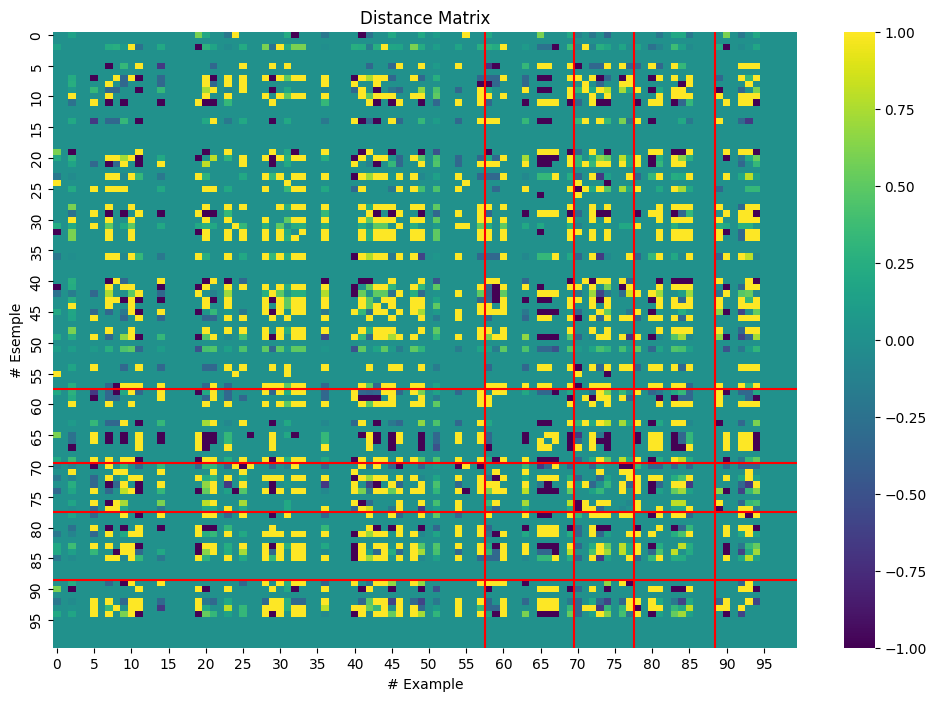

In [80]:
#using kmeans.labels_ I can order the matrix of f_distances
plt.figure(figsize=(12, 8))
sns.heatmap(f_distances[np.argsort(labels)][:, np.argsort(labels)], cmap='viridis',  fmt=".0f", xticklabels=5, yticklabels=5)
#change the label and the ticks since the examples are not ordered
plt.title('Distance Matrix')
plt.xlabel('# Example')
plt.ylabel('# Esemple')


#plot the boundaries of the clusters
boundaries = []
#cont for the different labels
cont = 1
for i in range(len(labels)-1):
    if labels[i] != labels[i+1]:
        boundaries.append(i)
        cont += 1
print(boundaries)

#plot them as vertical lines
for i in range(len(boundaries)):
    plt.axvline(boundaries[i]+1, c = 'r')
    plt.axhline(boundaries[i]+1, c = 'r')


In [81]:
for i,ev in enumerate(ord_neur):
    print(ev, "\t\t", labels[i])


[11, 10, 1, 9, 6, 3, 2] 		 0
[11, 10, 1, 9, 7, 4, 2, 5] 		 0
[10, 11, 7, 5, 4, 2, 8, 3, 1, 9] 		 0
[10, 2, 6] 		 0
[1, 6, 3, 7] 		 0
[9, 10, 6, 5, 7, 11, 2] 		 0
[3, 1, 7, 5, 10, 8, 11, 9, 2, 6] 		 0
[3, 1, 6, 4, 11, 2, 10, 5] 		 0
[6, 2, 10, 5, 3, 4, 8, 11, 7] 		 0
[6, 9, 11] 		 0
[8, 10, 11, 4, 3, 5, 6, 9] 		 0
[8, 4, 2] 		 0
[10, 5, 2, 6, 4, 1, 8] 		 0
[9, 1, 5, 2, 10, 6, 8] 		 0
[11, 9, 1, 7, 2, 3, 8, 10, 4] 		 0
[6] 		 0
[6, 8, 11, 7, 10, 9, 4, 2, 3] 		 0
[8] 		 0
[8] 		 0
[8, 2, 5, 1, 11] 		 0
[10, 9, 7, 11, 1, 3, 8, 6] 		 0
[1, 8, 6] 		 0
[6, 10, 5, 9, 4, 3, 11, 2, 7] 		 0
[11, 9, 6, 5, 8, 1, 2] 		 0
[9] 		 0
[5, 11, 2, 7, 9, 3, 4, 10] 		 0
[10, 8, 4, 7] 		 0
[2, 8, 3, 7, 9, 5, 6, 10, 11] 		 0
[11] 		 0
[9, 2] 		 0
[2] 		 0
[6, 2, 11, 9, 10] 		 0
[1, 5] 		 0
[5, 4, 8, 3, 6, 7, 1] 		 0
[6, 11, 9, 8, 4, 5, 1] 		 0
[2, 10, 5, 3] 		 0
[10, 8] 		 0
[8, 2, 5, 11, 10, 3] 		 0
[8, 2, 1, 10, 3] 		 0
[6, 10, 5, 9, 2, 4, 11, 7, 8, 1] 		 0
[8, 3, 6, 10, 2, 1, 11, 4, 9, 7] 		 0
[2, 11] 		 0


The things that can be improved are:
1. Consider the temporal order of firing, which has not been done here.